## Employee Performance Analysis

### Data Overview and Introduction
- Dataset Description: The dataset comprises employee-level data from INX Future Inc., covering demographic details, job roles, departmental affiliations, education, experience, and satisfaction metrics. It includes the target variable Performance Rating, enabling analysis of employee performance patterns and predictive modeling to identify performance influencers across various roles and departments.
- Problem Statement: INX Future Inc. faces declining employee performance and client satisfaction. To address this, the objective is to analyze employee data, identify performance drivers, and build a predictive model for employee performance. The aim is to support strategic decisions for hiring, departmental interventions, and morale-friendly corrective actions.

### 1. Import Libraries and Load the Dataset
In this step, you need to import all the libraries required for the analysis and load the dataset into the notebook.

In [1]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

### 2. Data Preparation
Data Collection and Loading: Load the dataset into a suitable environment (e.g. Pandas DataFrame).

In [3]:
# loading dataset
data=pd.read_csv('Employee Performance.csv')

In [5]:
# showing 1st five rows
data.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


### 3. Basic checks and EDA

In [7]:
# showing 1st five rows
data.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


In [9]:
# showing last five rows
data.tail()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,...,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,...,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,...,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,...,2,9,3,4,8,7,7,7,No,3
1199,E100998,24,Female,Life Sciences,Single,Sales,Sales Executive,Travel_Rarely,3,2,...,1,4,3,3,2,2,2,0,Yes,2


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

In [13]:
data.describe()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


### Preparing a Complete Data Analysis Report
a. Data Preprocessing:- Check for missing values and perform necessary preprocessing steps like handling missing data or encoding categorical variables.

In [15]:
data.isnull().sum()

EmpNumber                       0
Age                             0
Gender                          0
EducationBackground             0
MaritalStatus                   0
EmpDepartment                   0
EmpJobRole                      0
BusinessTravelFrequency         0
DistanceFromHome                0
EmpEducationLevel               0
EmpEnvironmentSatisfaction      0
EmpHourlyRate                   0
EmpJobInvolvement               0
EmpJobLevel                     0
EmpJobSatisfaction              0
NumCompaniesWorked              0
OverTime                        0
EmpLastSalaryHikePercent        0
EmpRelationshipSatisfaction     0
TotalWorkExperienceInYears      0
TrainingTimesLastYear           0
EmpWorkLifeBalance              0
ExperienceYearsAtThisCompany    0
ExperienceYearsInCurrentRole    0
YearsSinceLastPromotion         0
YearsWithCurrManager            0
Attrition                       0
PerformanceRating               0
dtype: int64

In [17]:
data.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


In [19]:
data.describe()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


In [21]:
data.columns

Index(['EmpNumber', 'Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

### Exploratory Data Analysis (EDA)
- Perform EDA to understand the distribution and relationship of the variables.
- Univariate Analysis: Look at the distribution of individual variables (e.g. histograms for continuous variables, bar plots for categorical variables and box plots).

<Figure size 30000x20000 with 0 Axes>

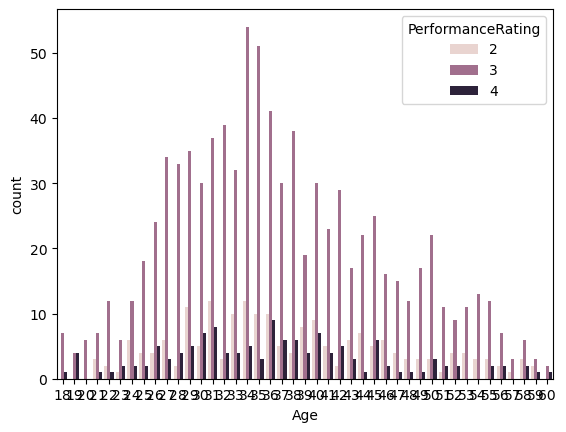

<Figure size 30000x20000 with 0 Axes>

In [25]:
# Univariate analysis
sns.countplot(x=data['Age'],hue=data['PerformanceRating'])
plt.figure(figsize=(300,200))

<Axes: xlabel='PerformanceRating', ylabel='Count'>

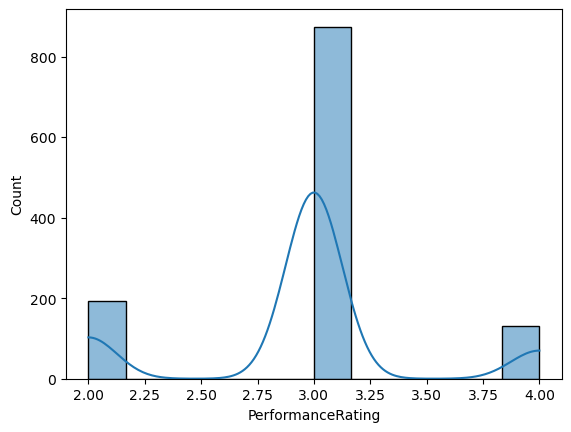

In [27]:
sns.histplot(x=data['PerformanceRating'],kde=True)

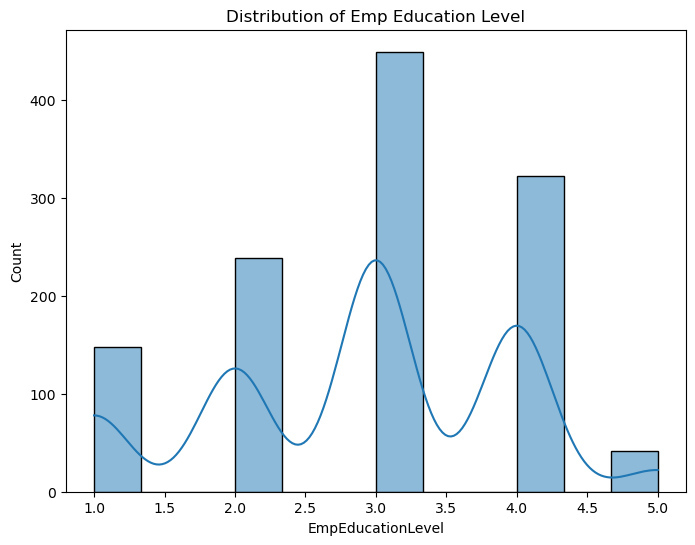

In [29]:
# Visualize the distribution of Emp Education Level
plt.figure(figsize=(8, 6))
sns.histplot(data['EmpEducationLevel'], kde=True)
plt.title('Distribution of Emp Education Level')
plt.show()

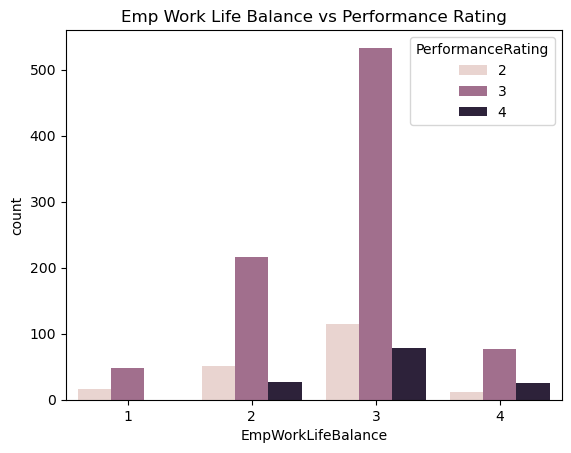

In [31]:
# Visualize the relationship between 'Emp Work Life Balance' and 'Performance Rating'
sns.countplot(x='EmpWorkLifeBalance', hue='PerformanceRating', data=data)
plt.title('Emp Work Life Balance vs Performance Rating')
plt.show()

### Feature Selection

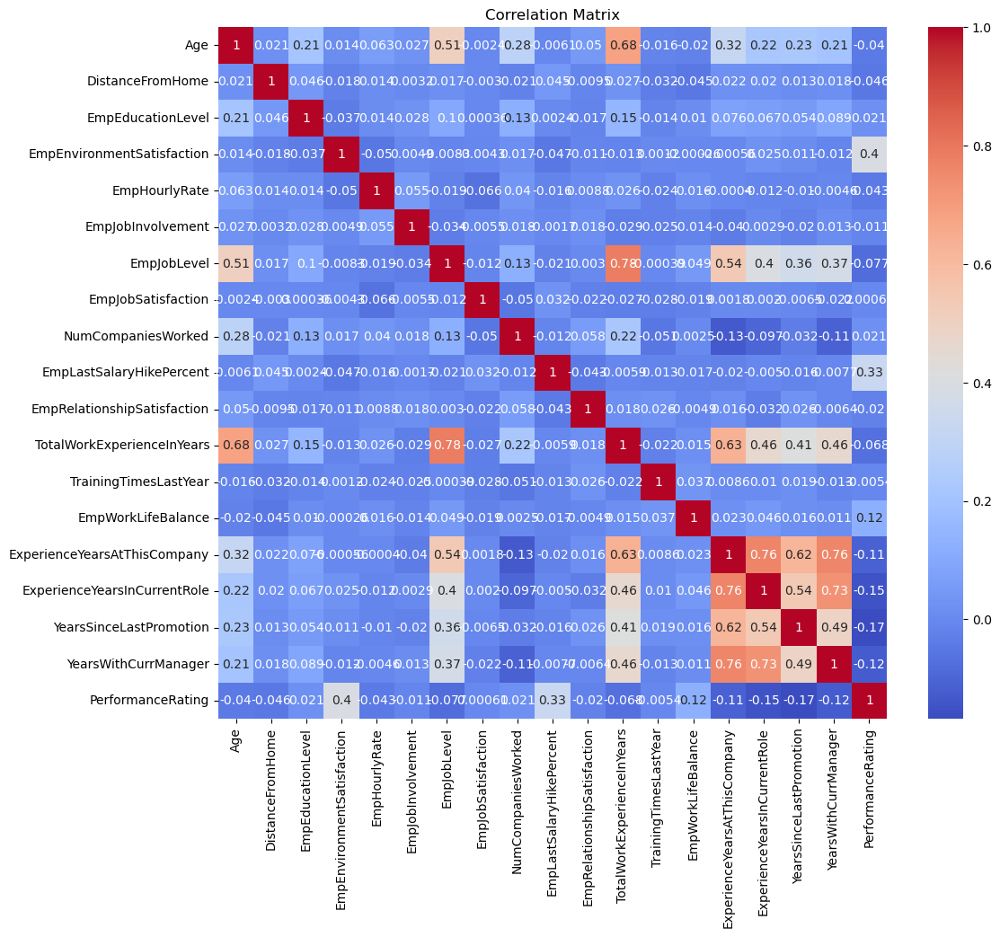

In [33]:
plt.figure(figsize=(12, 10))
sns.heatmap(data.corr(numeric_only=True), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

### Creating subplot

In [35]:
for i in data.columns:
    print(i)

EmpNumber
Age
Gender
EducationBackground
MaritalStatus
EmpDepartment
EmpJobRole
BusinessTravelFrequency
DistanceFromHome
EmpEducationLevel
EmpEnvironmentSatisfaction
EmpHourlyRate
EmpJobInvolvement
EmpJobLevel
EmpJobSatisfaction
NumCompaniesWorked
OverTime
EmpLastSalaryHikePercent
EmpRelationshipSatisfaction
TotalWorkExperienceInYears
TrainingTimesLastYear
EmpWorkLifeBalance
ExperienceYearsAtThisCompany
ExperienceYearsInCurrentRole
YearsSinceLastPromotion
YearsWithCurrManager
Attrition
PerformanceRating


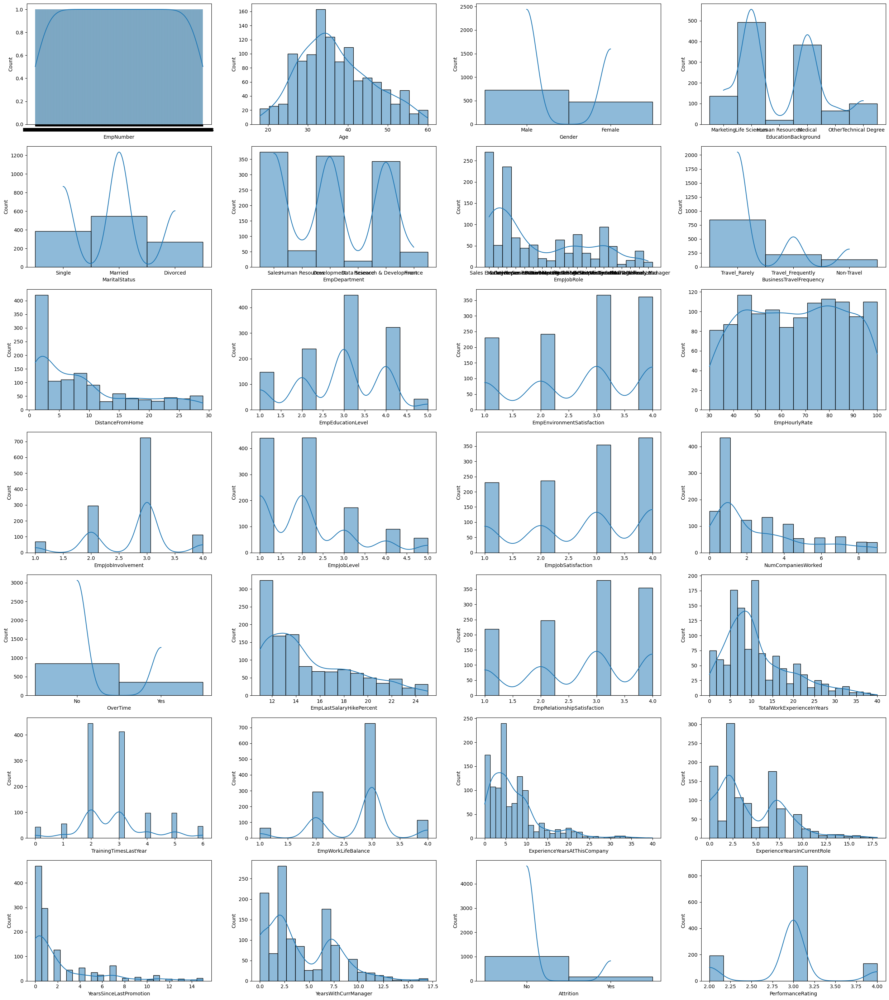

In [37]:
plt.figure(figsize=(25,28),facecolor='white')
plotnum=1
for i in data.columns:
    plt.subplot(7,4,plotnum)
    sns.histplot(x=data[i],kde=True)
    plotnum+=1
plt.tight_layout()

import warnings
warnings.filterwarnings('ignore') 

<Axes: xlabel='Age', ylabel='EmpJobLevel'>

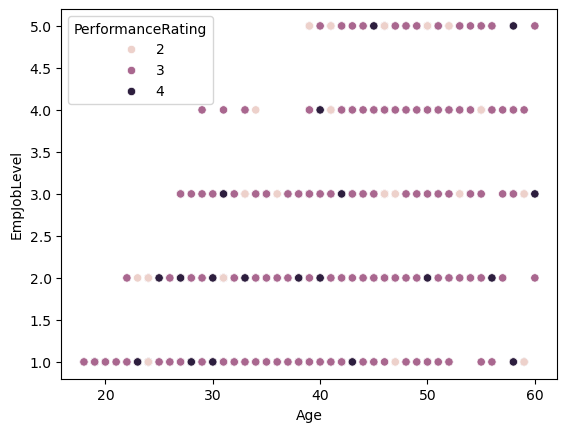

In [39]:
# Relation between Age and Emp Job Level
sns.scatterplot(x='Age',y='EmpJobLevel',data=data,hue='PerformanceRating')

<Figure size 5500x5500 with 0 Axes>

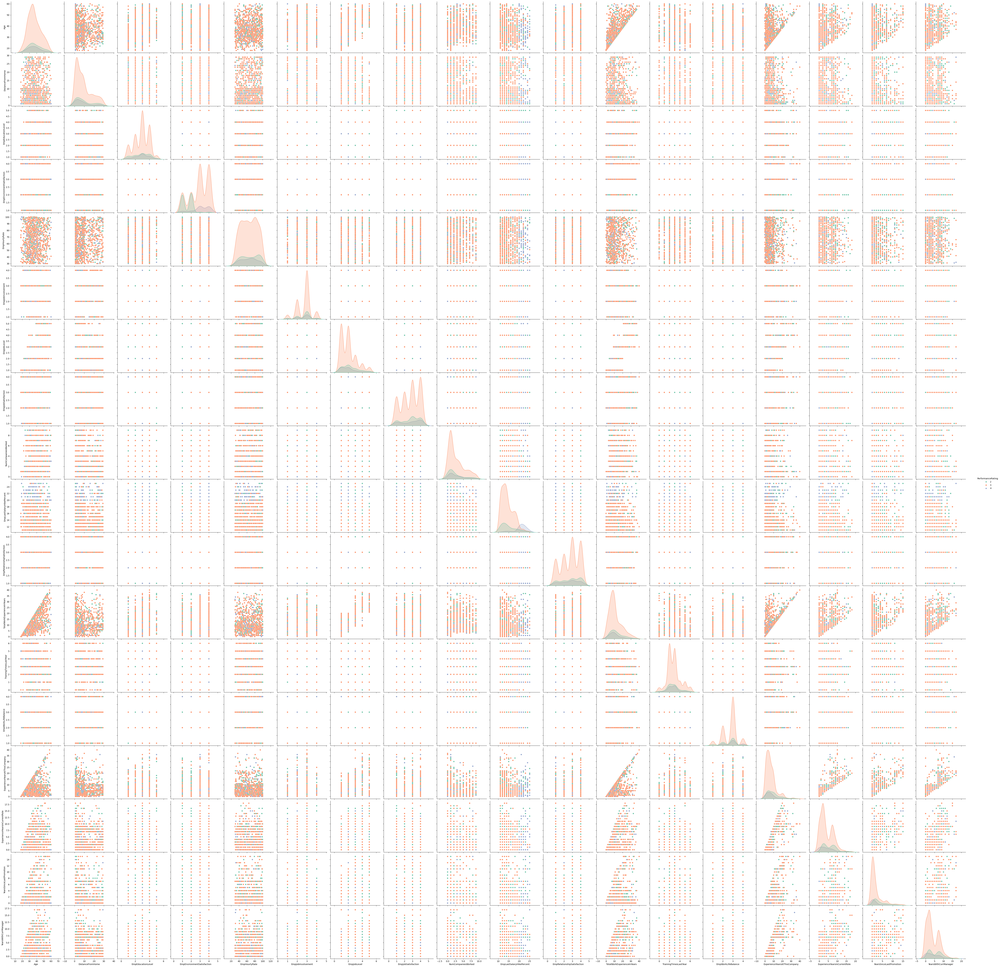

<Figure size 5500x5500 with 0 Axes>

In [41]:
# Multivariate 
sns.pairplot(data,hue='PerformanceRating',height=3.5, palette='Set2')
plt.figure(figsize=(55, 55))

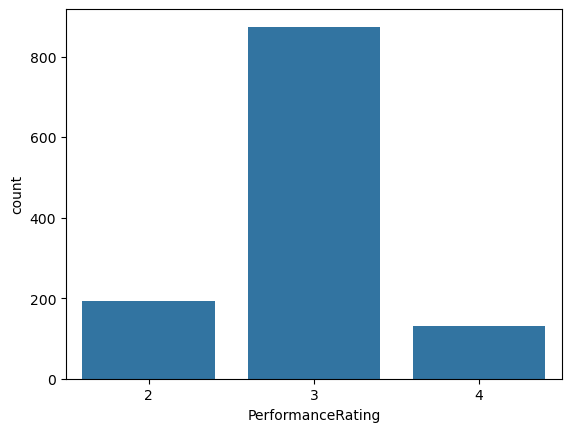

In [43]:
# Plotting the distribution of target variable
sns.countplot(x='PerformanceRating', data=data)
plt.show()

### 4. Data Preprocessing

In [45]:
data.isnull().sum()

EmpNumber                       0
Age                             0
Gender                          0
EducationBackground             0
MaritalStatus                   0
EmpDepartment                   0
EmpJobRole                      0
BusinessTravelFrequency         0
DistanceFromHome                0
EmpEducationLevel               0
EmpEnvironmentSatisfaction      0
EmpHourlyRate                   0
EmpJobInvolvement               0
EmpJobLevel                     0
EmpJobSatisfaction              0
NumCompaniesWorked              0
OverTime                        0
EmpLastSalaryHikePercent        0
EmpRelationshipSatisfaction     0
TotalWorkExperienceInYears      0
TrainingTimesLastYear           0
EmpWorkLifeBalance              0
ExperienceYearsAtThisCompany    0
ExperienceYearsInCurrentRole    0
YearsSinceLastPromotion         0
YearsWithCurrManager            0
Attrition                       0
PerformanceRating               0
dtype: int64

In [47]:
data.describe()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


### Handling Outliers

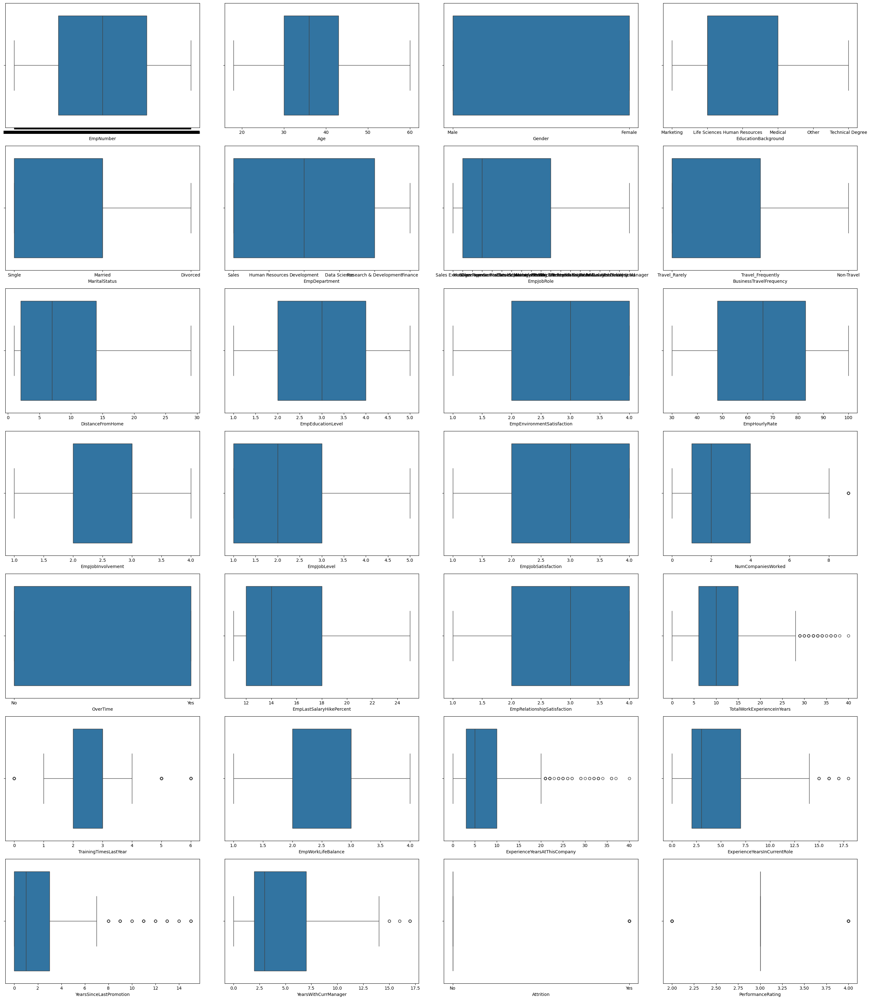

In [49]:
plt.figure(figsize=(28,32),facecolor='white')
plotnum=1
for i in data.columns:
    plt.subplot(7,4,plotnum)
    sns.boxplot(x=data[i])
    plotnum+=1
plt.tight_layout()

In [51]:
data.loc[data['ExperienceYearsAtThisCompany']>22,'ExperienceYearsAtThisCompany']=np.median(data['ExperienceYearsAtThisCompany'])

In [53]:
data.loc[data['ExperienceYearsInCurrentRole']>15,'ExperienceYearsInCurrentRole']=np.median(data['ExperienceYearsInCurrentRole'])

In [55]:
data.loc[data['TotalWorkExperienceInYears']>30,'TotalWorkExperienceInYears']=np.median(data['TotalWorkExperienceInYears'])

In [57]:
data.loc[data['YearsSinceLastPromotion']>8,'YearsSinceLastPromotion']=np.median(data['YearsSinceLastPromotion'])

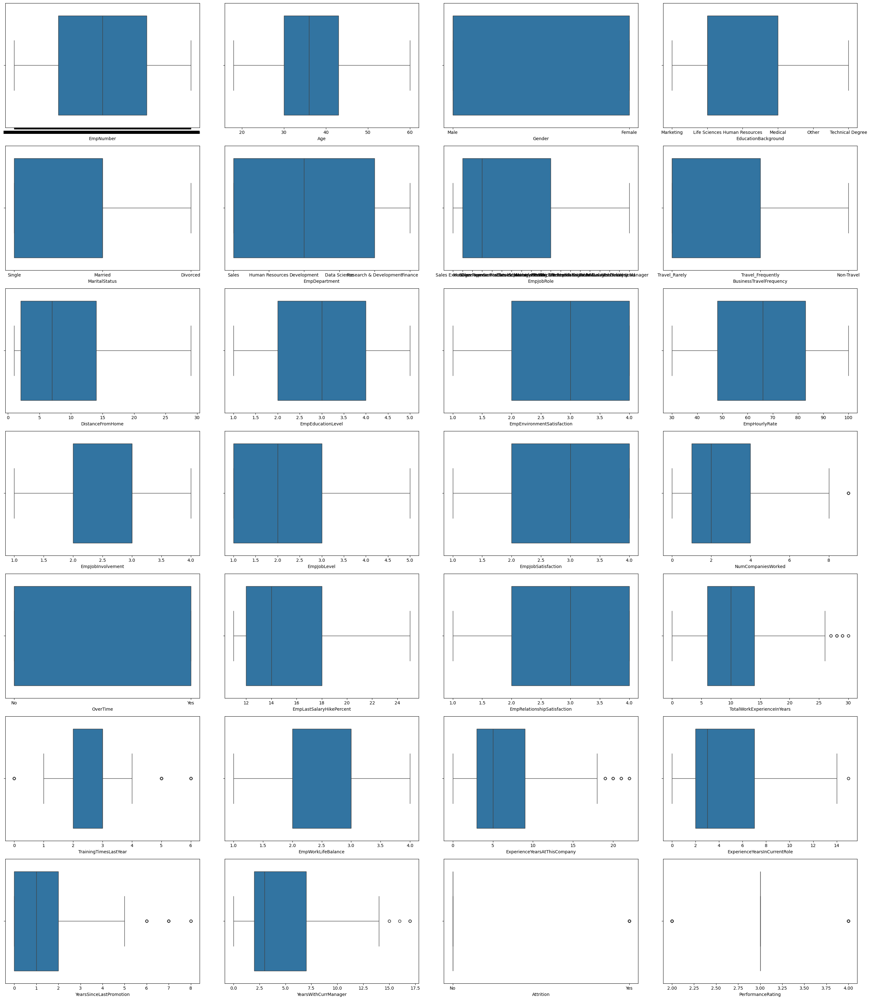

In [59]:
plt.figure(figsize=(28,32),facecolor='white')
plotnum=1
for i in data.columns:
    plt.subplot(7,4,plotnum)
    sns.boxplot(x=data[i])
    plotnum+=1
plt.tight_layout()

In [61]:
grouped = data.groupby('Attrition')[['Age', 'EmpHourlyRate', 'TotalWorkExperienceInYears']].mean()
print(grouped)

                 Age  EmpHourlyRate  TotalWorkExperienceInYears
Attrition                                                      
No         37.636008      66.203523                   11.150685
Yes        32.797753      64.707865                    7.320225


In [63]:
data = data.drop(columns=['EmpNumber'])

In [65]:
data['Gender'] = data['Gender'].map({'Male': 1, 'Female': 0})

In [67]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['EducationBackground'] = le.fit_transform(data['EducationBackground'])

In [69]:
data['MaritalStatus'] = data['MaritalStatus'].map({'Single': 0, 'Married': 1, 'Divorced' : 2})

In [71]:
data['BusinessTravelFrequency'] = data['BusinessTravelFrequency'].map({'Travel_Rarely': 0, 'Travel_Frequently': 1, 'Non-Travel' : 2})

In [73]:
data['OverTime'] = data['OverTime'].map({'Yes': 1, 'No': 0})

In [75]:
data['Attrition'] = data['Attrition'].map({'Yes': 1, 'No': 0})

In [77]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['EmpDepartment'] = le.fit_transform(data['EmpDepartment'])

In [79]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['EmpJobRole'] = le.fit_transform(data['EmpJobRole'])

In [81]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype
---  ------                        --------------  -----
 0   Age                           1200 non-null   int64
 1   Gender                        1200 non-null   int64
 2   EducationBackground           1200 non-null   int32
 3   MaritalStatus                 1200 non-null   int64
 4   EmpDepartment                 1200 non-null   int32
 5   EmpJobRole                    1200 non-null   int32
 6   BusinessTravelFrequency       1200 non-null   int64
 7   DistanceFromHome              1200 non-null   int64
 8   EmpEducationLevel             1200 non-null   int64
 9   EmpEnvironmentSatisfaction    1200 non-null   int64
 10  EmpHourlyRate                 1200 non-null   int64
 11  EmpJobInvolvement             1200 non-null   int64
 12  EmpJobLevel                   1200 non-null   int64
 13  EmpJobSatisfaction            120

### Model Creation
Model Selection: Choose appropriate machine learning models which include Logistic Regression, Decision Trees, Random Forest, Support Vector Machine (SVM), and XGBoost.

In [83]:
# Define features and target variable
X = data.drop('PerformanceRating', axis=1)
y = data['PerformanceRating']

In [85]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [87]:
logreg = LogisticRegression(multi_class='ovr', solver='lbfgs', max_iter=10000, class_weight='balanced')

In [89]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Then train the model on scaled data
logreg.fit(X_scaled, y)

LogisticRegression(class_weight='balanced', max_iter=10000, multi_class='ovr')

### Logistic Regression

In [91]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Initialize model
logreg = LogisticRegression(max_iter=10000)

# Train the model
logreg.fit(X_train, y_train)

# Make predictions on the test set
y_pred_logreg = logreg.predict(X_test)

# Evaluate the model
print("Logistic Regression Report:")
print(classification_report(y_test, y_pred_logreg))

Logistic Regression Report:
              precision    recall  f1-score   support

           2       0.52      0.48      0.50        29
           3       0.89      0.92      0.90       184
           4       0.78      0.67      0.72        27

    accuracy                           0.84       240
   macro avg       0.73      0.69      0.71       240
weighted avg       0.83      0.84      0.83       240



### Random Forest Classifier

In [93]:
from sklearn.ensemble import RandomForestClassifier

# Initialize model
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = rf.predict(X_test)

# Evaluate the model
print("Random Forest Report:")
print(classification_report(y_test, y_pred_rf))

Random Forest Report:
              precision    recall  f1-score   support

           2       0.96      0.90      0.93        29
           3       0.94      0.99      0.97       184
           4       1.00      0.70      0.83        27

    accuracy                           0.95       240
   macro avg       0.97      0.86      0.91       240
weighted avg       0.95      0.95      0.95       240



### Gradient Boosting Classifier

In [95]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize model
gb = GradientBoostingClassifier()

# Train the model
gb.fit(X_train, y_train)

# Make predictions on the test set
y_pred_gb = gb.predict(X_test)

# Evaluate the model
print("Gradient Boosting Report:")
print(classification_report(y_test, y_pred_gb))

Gradient Boosting Report:
              precision    recall  f1-score   support

           2       0.89      0.86      0.88        29
           3       0.94      0.97      0.95       184
           4       0.87      0.74      0.80        27

    accuracy                           0.93       240
   macro avg       0.90      0.86      0.88       240
weighted avg       0.93      0.93      0.93       240



### Support Vector Machine (SVM)

In [97]:
from sklearn.svm import SVC

# Initialize model
svm = SVC()

# Train the model
svm.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svm = svm.predict(X_test)

# Evaluate the model
print("SVM Report:")
print(classification_report(y_test, y_pred_svm))

SVM Report:
              precision    recall  f1-score   support

           2       0.00      0.00      0.00        29
           3       0.77      1.00      0.87       184
           4       0.00      0.00      0.00        27

    accuracy                           0.77       240
   macro avg       0.26      0.33      0.29       240
weighted avg       0.59      0.77      0.67       240



### Hyperparameter Tuning
To improve the performance of these models, you can perform hyperparameter tuning using GridSearchCV or RandomizedSearchCV.

In [99]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],  # Number of trees
    'max_depth': [None, 10, 20],      # Max depth of the tree
    'min_samples_split': [2, 5],      # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2]        # Minimum samples required to be at a leaf node
}

# Initialize the model
model = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the model
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-validation Score:", grid_search.best_score_)

# Evaluate the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
print(classification_report(y_test, y_pred))

Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Cross-validation Score: 0.9302083333333334
              precision    recall  f1-score   support

           2       0.96      0.90      0.93        29
           3       0.94      0.99      0.97       184
           4       1.00      0.70      0.83        27

    accuracy                           0.95       240
   macro avg       0.97      0.86      0.91       240
weighted avg       0.95      0.95      0.95       240



In [101]:
from sklearn.model_selection import cross_val_score
rf = RandomForestClassifier(n_estimators=100)
scores = cross_val_score(rf, X, y, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean Cross-validation score: {scores.mean()} ± {scores.std()}")

Cross-validation scores: [0.90416667 0.95416667 0.98333333 0.90416667 0.90416667]
Mean Cross-validation score: 0.93 ± 0.032956199888808636


### Confusion Matrix

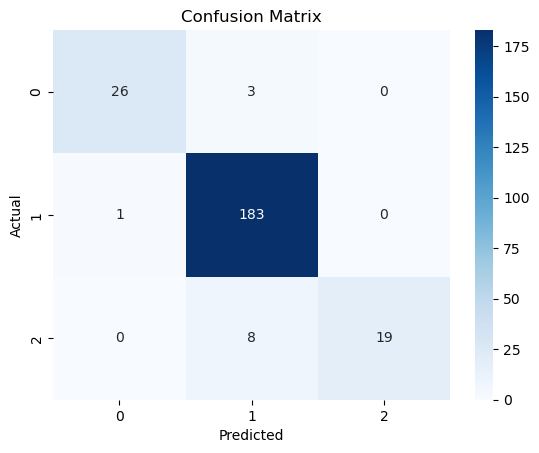

In [103]:
## from sklearn.metrics import confusion_matrix
import seaborn as sns

# Predict using the best model
y_pred = best_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1, 2], yticklabels=[0, 1, 2])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### Deployment

In [105]:
from sklearn.ensemble import RandomForestClassifier
import pickle

model = RandomForestClassifier()
model.fit(X_train, y_train)

with open("emp.pkl", "wb") as f:
    pickle.dump(model, f)

In [107]:
with open("emp.pkl", "rb") as f:
    loaded_model = pickle.load(f)

loaded_model.predict(X_test[:1])  

array([3], dtype=int64)

### Streamlit Deployment Link
  https://employeeperformance-56qdygjgmoqjninrzmlkmf.streamlit.app    

### Github Link
 https://github.com/Tamanna-Goel/employee_performance 

### Recommendations to Improve Employee Performance
- Enhance Job Involvement
→ Encourage participation in decision-making, offer challenging tasks, and align roles with employee strengths.
- Improve Work-Life Balance
→ Introduce flexible working hours, hybrid work models, and wellness programs to reduce burnout.
- Boost Environment Satisfaction
→ Regularly assess workplace conditions, provide a positive physical and cultural environment, and address employee feedback promptly.
- Increase Opportunities for Training and Development
→ Offer regular skill-enhancement programs, mentorship, and career growth opportunities to maintain engagement.
- Focus on Managerial Relationships
→ Train managers in leadership and communication skills to build stronger relationships and trust with team members.
- Recognize and Reward Performance
→ Implement transparent and fair reward systems for high-performing employees to reinforce positive behaviour.
- Monitor and Support Post-Promotion Growth
→ Provide structured support and training after promotions to help employees adapt and perform well in new roles.
- Reduce Attrition
→ Conduct exit interviews, improve onboarding, and create a culture of inclusion and long-term growth to retain talent.
- Tailor Department-Specific Interventions
→ Focus improvement efforts on departments with consistently lower performance ratings.

### Challenges Faced and Solutions

##### Data Quality Issues
- Presence of categorical variables like gender, department, job role, etc., which machine learning models cannot process directly.
- Outliers in features like Hourly Rate, Distance from Home, and Num Companies Worked potentially affecting model accuracy.
- Ensuring no missing values and maintaining data integrity throughout the pipeline.
- Choosing the most suitable model for prediction given multiple algorithm performances.
- Balancing model performance with interpretability for business decision-making.

##### Solutions and Model Performance
- Balancing model performance with interpretability for business decision-making.
- Conducted outlier detection and handling using boxplots and statistical thresholds.
- Verified and confirmed that the dataset contained no null values, ensuring smooth preprocessing.
- Evaluated models on multiple metrics (accuracy, precision, recall, F1-score) and selected Random Forest for its superior performance.
- Chose Random Forest, which not only performed well but also offered feature importance insights to support strategic decisions.

### Conclusion
- The project aimed to analyse employee data from INX Future Inc. to understand factors affecting performance and build a predictive model.
- Exploratory Data Analysis revealed that factors like Job Involvement, Work-Life Balance, and Environment Satisfaction have a significant impact on employee performance.
- Data preprocessing steps included:
   - Outlier detection and handling
   - Label encoding and mapping of categorical variables
- Multiple machine learning models were trained and evaluated:
   - Logistic Regression – Accuracy: 84%
   - Support Vector Machine – Accuracy: 77%
   - Gradient Boosting – Accuracy: 93%
   - Random Forest – Best Accuracy: 95%
- The Random Forest Classifier was chosen as the best-performing model with:
   - Precision: 96%
   - Recall: 90%
   - F1-Score: 93%
- The model can now be used to:
   - Predict new employee performance during hiring
   - Identify low performers for early intervention
   - Support management decisions with data-backed insights
- These results will help INX improve performance, maintain employee morale, and uphold its reputation as a top employer.

                                                 ------------------------------------------